# Machine Learning Project : Hotel bookings
<br><p>I have been working on this dataset as a school project for the last three weeks. My intention was to try out the major supervised learning algorithms we saw on the course, compare their respective performances and try to bring up some insights from the data.<br>
Indeed, the dataset includes all the bookings of two hotels along with information about the guests, the room types, check-in and check-out dates, etc… We will apply techniques of Exploratory Data Analysis (EDA) to discover patterns in the data, and then apply basic machine learning methods to predict if a booking will be cancelled in the future or not.</p>

### Exploratory Data Analysis
### Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
%matplotlib inline
import seaborn as sns
import pydantic_settings
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

### Import project files
 First, we will import the file containing the descriptions of the columns in the CSV file, to be used in understanding the content of each column. Then the CSV file will be imported for analysis.

### COLUMN'S DESCRIPTION

<img src="1.png" alt="description-1" />
<img src="2.png" alt="description-1" />
<img src="3.png" alt="description-1" />
<img src="4.png" alt="description-1" />
<img src="5.png" alt="description-1" />

In [2]:
#reading the csv file and printing the size of data in (row, column) form

booking_data = pd.read_csv('hotel_bookings.csv')
print('The shape of the overall database is: ', booking_data.shape,'\n')

The shape of the overall database is:  (119390, 32) 



### Preliminary observations and Findings 
First, let's explore the booking columns across the dataset to look for <strong>aberrant or missing values</strong><br>
The first observation is that some columns are not fully populated, and this means we need to replace the missing values. And there are <strong>four</strong> columns obeying this observation:
<strong>'Children', 'Country', 'agent' and 'company'.</strong>

In [3]:
#printing the status of specific columns of the dataset

booking_data.loc[:,['is_canceled','children','country', 'agent', 'company']].info()

#replacing the values of null fields
booking_data.country.fillna('-', inplace=True)
booking_data.agent.fillna(0, inplace=True)
booking_data.company.fillna(0, inplace=True)
booking_data.children.fillna(0, inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   is_canceled  119390 non-null  int64  
 1   children     119386 non-null  float64
 2   country      118902 non-null  object 
 3   agent        103050 non-null  float64
 4   company      6797 non-null    float64
dtypes: float64(3), int64(1), object(1)
memory usage: 4.6+ MB


In [4]:
booking_data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,avg_daily_rate,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,7/3/2015


In [5]:
booking_data.country.unique()

array(['PRT', 'GBR', 'USA', 'ESP', 'IRL', 'FRA', '-', 'ROU', 'NOR', 'OMN',
       'ARG', 'POL', 'DEU', 'BEL', 'CHE', 'CN', 'GRC', 'ITA', 'NLD',
       'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN', 'MOZ',
       'BWA', 'LUX', 'SVN', 'ALB', 'IND', 'CHN', 'MEX', 'MAR', 'UKR',
       'SMR', 'LVA', 'PRI', 'SRB', 'CHL', 'AUT', 'BLR', 'LTU', 'TUR',
       'ZAF', 'AGO', 'ISR', 'CYM', 'ZMB', 'CPV', 'ZWE', 'DZA', 'KOR',
       'CRI', 'HUN', 'ARE', 'TUN', 'JAM', 'HRV', 'HKG', 'IRN', 'GEO',
       'AND', 'GIB', 'URY', 'JEY', 'CAF', 'CYP', 'COL', 'GGY', 'KWT',
       'NGA', 'MDV', 'VEN', 'SVK', 'FJI', 'KAZ', 'PAK', 'IDN', 'LBN',
       'PHL', 'SEN', 'SYC', 'AZE', 'BHR', 'NZL', 'THA', 'DOM', 'MKD',
       'MYS', 'ARM', 'JPN', 'LKA', 'CUB', 'CMR', 'BIH', 'MUS', 'COM',
       'SUR', 'UGA', 'BGR', 'CIV', 'JOR', 'SYR', 'SGP', 'BDI', 'SAU',
       'VNM', 'PLW', 'QAT', 'EGY', 'PER', 'MLT', 'MWI', 'ECU', 'MDG',
       'ISL', 'UZB', 'NPL', 'BHS', 'MAC', 'TGO', 'TWN', 'DJI', 'STP',
       'KNA', 'E

In [6]:
# The report includes a summary of the data, missing values, and a distribution of variables.
# It also provides insight into the relationships between variables and the correlations between them.

profile = ProfileReport(booking_data, title='booking_data')

In [7]:
#creating an interactive widget

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### <u>Q. What type of hotels suffer more from cancellation?</u>
Not all bookings are the same!<br>
As you may know, each row in this dataset corresponds to a booking, but one row may be related to one person while antoher may be for several. The same thing stands for the nights stayed (one would book a weekend while another may stay longer). 
<br>Let's build some useful columns for later calculations, such as total stay nights and the number of booked people (except babies) per row. Another column will be added to account for the difference between the <i>reserved_room_type</i> and the <i>assigned_room_type</i> and included in our analysis.

* Overall, 44224 bookings were canceled, accounting for 37 percent of booked stays.


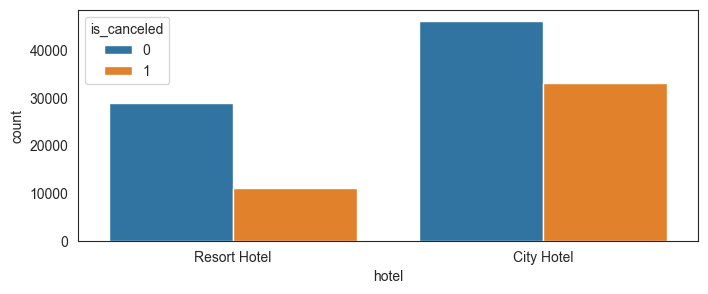

In [8]:
#combining the data of children and adults column in one column
booking_data['pax'] = booking_data.children+booking_data.adults

#combining week days and weekends stay in nights
booking_data['stay_nights'] = booking_data.stays_in_week_nights+booking_data.stays_in_weekend_nights

# 
booking_data['bill']=booking_data.stay_nights*booking_data.avg_daily_rate

#
booking_data['room_assignment'] = booking_data['reserved_room_type']==booking_data['assigned_room_type']

#summmation and percentage of cancelled bookings and printing them.
print('* Overall, %2.0f bookings were canceled, accounting for %2.0f percent of booked stays.'
      %(booking_data.is_canceled.sum(), booking_data.is_canceled.mean()*100))

#setting the size of plot or graph.
plt.figure(figsize=(8,3))

sns.set_style("white")

#creating the countplot with hue 
sns.countplot(x='hotel', hue='is_canceled', data=booking_data)
plt.show()

Cancellation Financial impact
Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'avg_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'pax', 'stay_nights',
       'bill', 'room_assignment'],
      dtype='object')
hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_mont

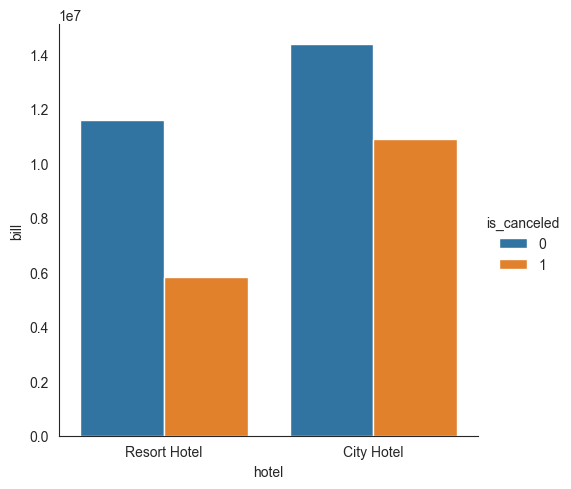

In [9]:
#printing columns list and data types of all the columns

print('Cancellation Financial impact')
print(booking_data.columns)
print(booking_data.dtypes)

#making a categorical plot of hotel column and is_cancelled column
sns.catplot(x='hotel', y='bill', hue='is_canceled', estimator=sum, ci=None, kind='bar', data=booking_data)
plt.show()

<strong>The majority of canceled bookings are in 'City Hotels' even though both establishments suffer from cancellation to a certain degree.</strong>
#### <u>Q. Do people from a specific country tend to cancel their booking more than the others?</u>

We will now build a grouped table to calculate the column values per country. We will use this to first display the top countries by number of fulfilled bookings.

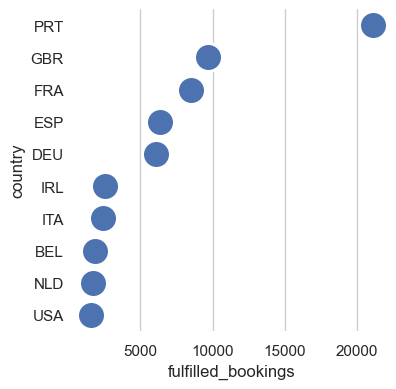

In [10]:
# we analyzed booking data based on the country of origin.

# grouping the booking_data DataFrame by country
booking_country = pd.DataFrame(booking_data.groupby('country').sum())

# selecting specific columns from the booking_country DataFrame, including is_canceled, stay_nights, and pax
booking_country = booking_country.loc[:,['is_canceled','stay_nights','pax']]
booking_country['booking_count'] = booking_data.groupby('country').hotel.count()

#calculates the cancellation_rate and  by dividing the number of canceled bookings and fulfilled bookings by the total booking count
booking_country['cancellation_rate'] =  booking_country.is_canceled.div(booking_country.booking_count)
booking_country['fulfillment_rate'] =  1-booking_country.is_canceled.div(booking_country.booking_count)

#fulfilled bookings column excludes canceled bookings from the total booking
booking_country['fulfilled_bookings'] =  booking_country['booking_count']-booking_country['is_canceled']
sns.set(style="whitegrid")

#visualizing the fulfilled bookings data by country
toprint = booking_country.reset_index().sort_values(by='fulfilled_bookings', ascending=False).head(10)
g = sns.PairGrid(toprint, x_vars=toprint.columns[7:8], y_vars=['country'], height=4)
sns.despine(left=True, bottom=True)

#strip-plot
g.map(sns.stripplot, size=20, orient="h", palette="ch:s=1,r=-.1,h=1_r", linewidth=2, edgecolor="w")
plt.show()

The countries on the top of the chart are all european, with a remarkable lead for <strong>Portugal</strong>. If we hypothesize that the dataset is for bookings in the same geographical area, we may claim that the establishments object of the bookings are located in the <strong>Iberian peninsula</strong> in order to justify the affluence of customers from this region. And given that <b>Portugal</b> has a small population (10M) compared to the UK, France and Spain, it would be hard to claim that the hotels are Spain. Thus, we conclude that the stablishments are in <b>Portugal</b>.
<br><br>Now let's move back to our dataset and analyze the countries with the highest cancellation rates. It is common sense that a high number of cancellations for a given country could be due to the fact that the overall reservations are also important. So the suitable approach would be to compare percentages.

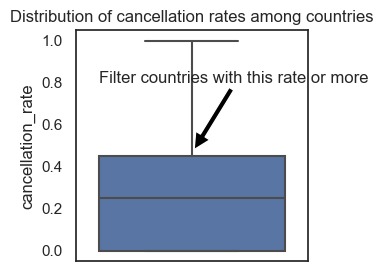

In [11]:
#adjusting the size of figure
plt.figure(figsize=(3,3))
sns.set_style("white")

#creating boxplot and using dataframe --> booking_country, and data of cancellation rate
sns.boxplot(data=booking_country, y='cancellation_rate')

#annoting in the figure and explaining through the text mentioned
plt.annotate('Filter countries with this rate or more', xy=(0.01, 0.48), xytext=(-0.4, 0.8), arrowprops=dict(facecolor='black', shrink=1))
plt.title('Distribution of cancellation rates among countries')
plt.show()

After we've distributed the countries per rate of cancellation, we will filter the countries higher than the 75th percentile.
<br>The calculations determined that the 75th quantile is at a cancellation rate of 45%. Nonetheless, we will neglect the countries with low reservations count (<100) even if they present high cancellation rates for the sake of the analysis.<br>
The over-sized points are countries with high cancellation rates while at the same time having an important number of reservations overall. Let's zoom in on the cluster at the left to enumerate those countries.

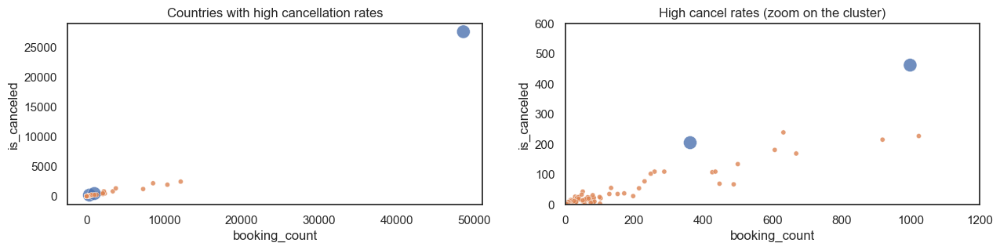

In [12]:
#print(booking_country.quantile(0.75))

# Assigning the booking_country DataFrame to a new variable called booking_country_plot
booking_country_plot = booking_country

#Adding a new column called hue to the booking_country_plot DataFrame
#column is created based on two conditions: cancellation_rate < 0.45 and booking_count < 100
# hue column will be used to differentiate data points
booking_country_plot['hue'] = (booking_country['cancellation_rate']<0.45)|(booking_country['booking_count']<100)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,3))

sns.set_style('whitegrid')
ax1.set_title('Countries with high cancellation rates')

# two subplots of scatterplot (legend=False to remove the legend from the plot)
# size and hue parameters are used to determine the size and color of the data points
sns.scatterplot(data=booking_country_plot, x='booking_count', y='is_canceled', size='hue', hue='hue', sizes=(20,150), alpha=0.8, legend=False, ax=ax1)
ax2.set_title('High cancel rates (zoom on the cluster)')
sns.scatterplot(data=booking_country_plot, x='booking_count', y='is_canceled', hue='hue', size='hue', sizes=(20,150), alpha=0.8, legend=False, ax=ax2)

#Setting the x-axis limits
plt.xlim(0,1200)

#Setting the y-axis limits
plt.ylim(0,600)
plt.show()

In [13]:
print('If we do not account for countries with negligible booking counts, the TOP 3 countries in terms of cancelling reservations are : Portugal, China and Angola.')

# dataframe is sorted in descending order based on the is_canceled column, which represents the cancellation rate
# booking_country_plot dataframe is filtered to exclude countries with negligible booking counts (booking_country_plot['hue']==False)
display(booking_country_plot[booking_country_plot['hue']==False].sort_values(by='is_canceled', ascending=False).loc[:,'is_canceled':'cancellation_rate'])

If we do not account for countries with negligible booking counts, the TOP 3 countries in terms of cancelling reservations are : Portugal, China and Angola.


,is_canceled,stay_nights,pax,booking_count,cancellation_rate
country,,,,,
PRT,27519,141654,89599.0,48590,0.566351
CHN,462,2642,2021.0,999,0.462462
AGO,205,2938,647.0,362,0.566298


#### <u>Q. In which period of the year the number of bookings peak? Can you spot any seasonality?</u>
Now let's address the seasonality of the bookings, by finding the months during which the bookings peak.

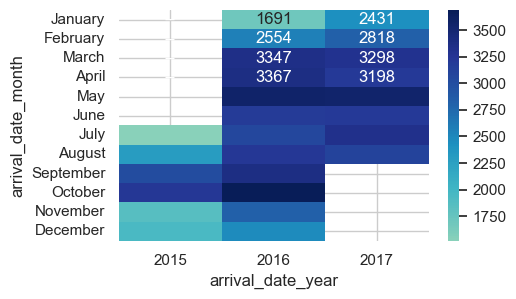

In [14]:
# Filtering out the canceled bookings and creating a pivot table
bookings = booking_data[booking_data['is_canceled']==0].pivot_table(index='arrival_date_month', columns='arrival_date_year', values='hotel', aggfunc=len, fill_value=0)
bookings.index = pd.CategoricalIndex(bookings.index, categories=['January', 'February', 'March', 'April','May','June','July', 'August','September', 'October', 'November', 'December'], ordered=True)
bookings = bookings.sort_index()

# We create a mask array to hide certain cells in the heatmap. The mask is a 2D array where 1 represents visible cells and 0 represents hidden cells
mask = np.array([[1, 0, 0], [1, 0, 0], [1, 0, 0], [1, 0, 0], [1, 0, 0], [1, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 1], [0, 0, 1], [0, 0, 1], [0, 0, 1]])

# create a figure and axis object using plt.subplots and specify the size of the heatmap
f, ax = plt.subplots(figsize=(5, 3))

# We pass the bookings pivot table as the data, set the center value to 2000 for color scaling, enable annotations, apply the mask,
# format the cell values as integers, specify the axis object, and choose the color map.
sns.heatmap(bookings, center=2000, annot=True, mask=mask, fmt="d", ax=ax, cmap="YlGnBu")
sns.set_context('paper')
plt.show()

This matrix shows that the number of fulfilled reservations peak each year at the months of <strong>May</strong> and <strong>October</strong>. We may at a later stage leave out the <i>'arrival_year'</i> feature for the training since there is a certain seasonality.
#### <u>Q. What are the features that are more correlated with booking cancellation?</u>

In [15]:
#booking_data that contains various categorical variables

# convert each categorical variable to the category data type using the .astype('category') method
# we use the .cat.codes method to convert the categorical variables to numeric codes

from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
label_encoder = LabelEncoder()

for column in ['hotel', 'arrival_date_month', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'assigned_room_type', 'reservation_status', 'customer_type', 'deposit_type', 'reservation_status_date']:
    booking_data[column] = LabelEncoder().fit_transform(booking_data[column])

#New table
print(booking_data)
print('The maximum correlation between \'is_canceled\' and any other numeric feature is  %2.2F' %booking_data.corr().loc['lead_time':,'is_canceled'].abs().max())

        hotel  is_canceled  lead_time  arrival_date_year  arrival_date_month  \
0           1            0        342               2015                   5   
1           1            0        737               2015                   5   
2           1            0          7               2015                   5   
3           1            0         13               2015                   5   
4           1            0         14               2015                   5   
...       ...          ...        ...                ...                 ...   
119385      0            0         23               2017                   1   
119386      0            0        102               2017                   1   
119387      0            0         34               2017                   1   
119388      0            0        109               2017                   1   
119389      0            0        205               2017                   1   

        arrival_date_week_number  arriv

We can infer that there is little correlation between any numerical feature and the target label <i>'is_canceled'</i>, the closest one being <i>'lead_time'</i>. Let's explore the correlation with categorical features.<br>
By previewing each feature by itself while counting the fulfilled bookings vs the cancelled ones, we can detect some patterns. In fact, most of the features have a homogenous distribution of cancellations among the unique values, which is a clear indication that there is little chance for the feature to have a correlation with the label to predict. The columns <i>'arrival_date_month'</i> and <i>'arrival_date_week_number'</i> illustrate this effect:

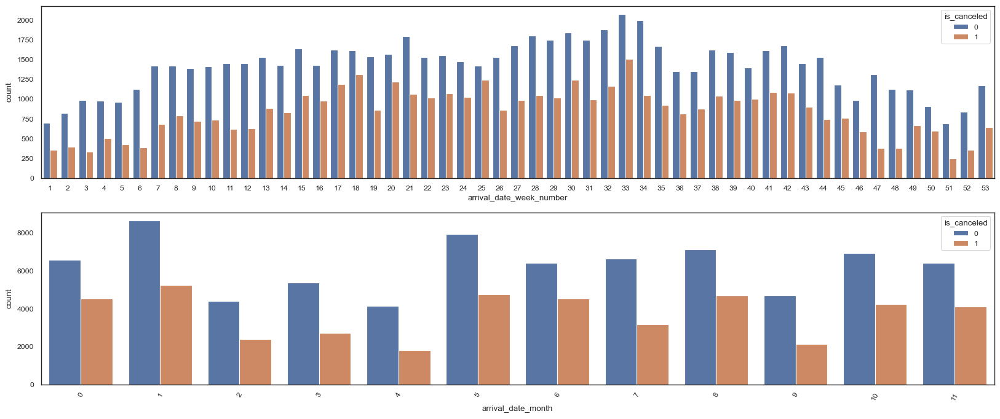

In [16]:
sns.set_style("white")

#creating subplot and adjusting size
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(20,8))

# two countplot, one regarding the week number and another of ther month
sns.countplot(data=booking_data, x='arrival_date_week_number', hue='is_canceled', ax=ax1)
sns.countplot(data=booking_data, x='arrival_date_month', hue='is_canceled', ax=ax2)
plt.xticks(rotation=60)
plt.show()

In contrast, other features displayed a certain bias when segregated by cancellation. This pointed us towards some features of interest.

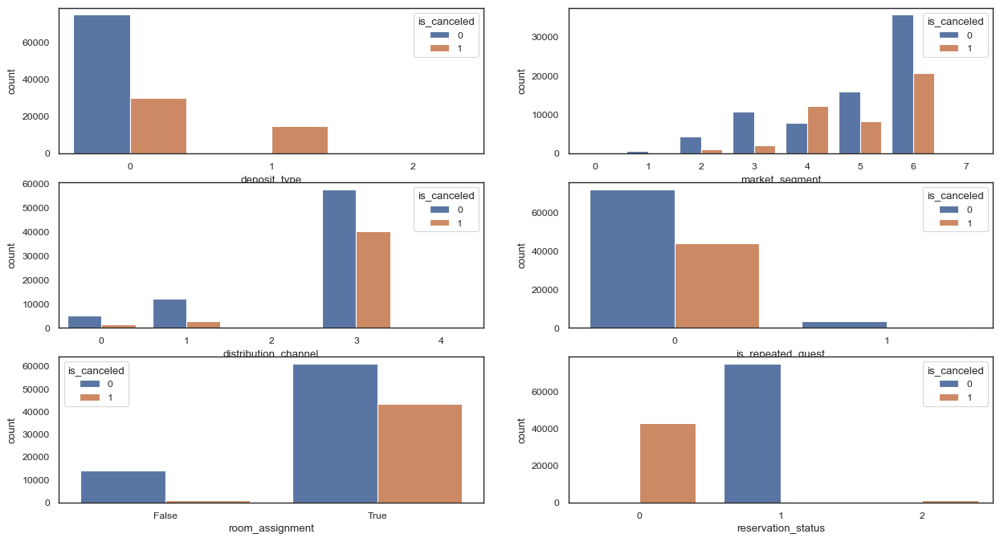

In [17]:
sns.set_style("white")
fig, axes = plt.subplots(3, 2, figsize=(15,8))

#deposit type, 0 = no deposit, 1 = not refundable, 2 = refundable
sns.countplot(data=booking_data, x='deposit_type', hue='is_canceled', ax=axes[0][0])


sns.countplot(data=booking_data, x='market_segment', hue='is_canceled', ax=axes[0][1])
sns.countplot(data=booking_data, x='distribution_channel', hue='is_canceled', ax=axes[1][0])
sns.countplot(data=booking_data, x='is_repeated_guest', hue='is_canceled', ax=axes[1][1])
sns.countplot(data=booking_data, x='room_assignment', hue='is_canceled', ax=axes[2][0])
sns.countplot(data=booking_data, x='reservation_status', hue='is_canceled', ax=axes[2][1])
plt.show()

In fact, we deduced that these are the columns with the highest correlation with the label to predict:
>* In regards to 'deposit_type': 'Non Refund' bookings are canceled almost all the time
* Also, the cancellation rate varies a lot for different values of 'market_segment' and 'distribution_channel'
* Repeated guests cancel their bookings a lot fewer than non-repeated guests do.

As for the last attribute, there is a perfect connection between the values. For each row that has 'reservation_status' set to 'Check-Out', the label 'is_canceled' is null, and is equal to '1' on the other cases. So this feature will be left out during the training.
<br><i>NB: A test has been done with the feature 'reservation_status', after creating the dummies, and it generated a model with a perfect score with DecisionTree as the algorithm.</i>

Before moving on to the ML part, one peculiar thing that got our attention while cleaning the data, is the presence of 715 rows with null numbers of stay nights (weekends or throughout the week) and a null average daily rate. We investigated the rows to find patterns, and observed that they are scattered along all the features (hotel, arrival dates, meals...), except that:<br>
* The majority are locals (PRT) and the bookings are 'checked-out'
* They are related to 'transient' clients and signed for B&B
* They had 'No-deposits' 
* Booked for 2 people mostly (sometimes 1 person) and almost all of them had 0 'days in waiting list'

We immediately started hypothesizing:<br>
<b>H1</b>: They could be related to clients showing up at he last minute (0 days waiting list) and leaving immediately (maybe not liking the establishment, price...), but they're all labeled as 'Checked-out'<br>
<b>H2</b>: Neither is it plausible to say that it could be clients who book lunch/dinner or to the bar, as it does not make sense to create a booking for that, and a lot of bookings are B&B.<br>
...among another 3 or 4 hypotheses that were far-fetched. We finally decided it has something to do with the validity of the data. So, whether it is maliciously rigged or just a mistake in record keeping, this means that there are bills not accounted for in the establishement. Let's calculate the supposed losses, and drop the rows.

In [18]:
# Subset of bookings with stay nights = 0
bb = booking_data[(booking_data['stay_nights'] == 0)]['is_canceled'].value_counts()

# Subset of fulfilled bookings
rr = booking_data[(booking_data['stay_nights'] != 0) & (booking_data['is_canceled'] == 0)]['is_canceled'].value_counts()

# Calculate the expected amount
expected_amount = (bb * rr).sum()  # Sum the values in the resulting series

print('The average amount to be expected from the bookings is $%.2f' % expected_amount)


The average amount to be expected from the bookings is $50650480.00


In [19]:
booking_data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'avg_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'pax', 'stay_nights',
       'bill', 'room_assignment'],
      dtype='object')

## Machine Learning
### Import libraries

In [20]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import VotingClassifier, BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import roc_auc_score

### Prepare the inputs
To tackle the model traning part, we need to deal with categorical features, by replacing them with dummy columns. The features at hand are:<br>
<i>hotel, market_segment, distribution_channel, room_assignmnt, deposit_type, is_repeated_guest</i>

In [21]:
# booking_app = booking_data[['is_canceled', 'hotel','country', 'reserved_room_type', 'assigned_room_type', 'children', 'adults', 'avg_daily_rate', 'arrival_date_year', 'arrival_date_month']]

In [22]:
# booking_app.columns

In [23]:
bookings = booking_data[['is_canceled', 'hotel','country', 'reserved_room_type', 'assigned_room_type', 'children', 'adults', 'avg_daily_rate', 'arrival_date_year', 'arrival_date_month']]


Then, we need to split the dataframe into features (booking columns) and the label to predict ('is_canceled'). Next, we will split the dataframe into a training set (<strong>X_train and y_train</strong>) and a test set (<strong>X_test and y_test</strong>).

In [24]:
# We drop the 'is_canceled' column from the dataset
X = bookings.drop(['is_canceled'], axis=1)
X.head()
# 'is_canceled' column is assigned to the variable y, which represents the target variable we want to predict

,hotel,country,reserved_room_type,assigned_room_type,children,adults,avg_daily_rate,arrival_date_year,arrival_date_month
0,1,136,2,2,0.0,2,0.0,2015,5
1,1,136,2,2,0.0,2,0.0,2015,5
2,1,60,0,2,0.0,1,75.0,2015,5
3,1,60,0,0,0.0,1,75.0,2015,5
4,1,60,0,0,0.0,2,98.0,2015,5


In [25]:
y = bookings['is_canceled']
y.head()

0    0
1    0
2    0
3    0
4    0
Name: is_canceled, dtype: int64

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)

### Prepare the model
By preparing the model, we mean choosing the algorithm, instantiating it and then fitting it to the training set. The algorithms that are suited for the problem at hand, which is a classification, are the following:
<ul><li>Decision trees (CART)</li><li>KNN (with confusion matrix)</li><li>Logistic regression (with ROC)</li><li>A boosted model with a combination of all the above.</li>    
</ul>

#### Decision Tree Classifier
<br>We'll start with a  <strong>decision tree classifier</strong> as a first attempt to model the problem. We will tackle this through the conventional paradigm (instantiate, fit, predict, assess performance)

In [27]:
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline,Pipeline

In [28]:
steps = [
    ('scaler', StandardScaler()),  # StandardScaler as the first step
    ('random_forest', RandomForestClassifier(
        n_estimators=200,
        min_samples_split=2,
        min_samples_leaf=4,
        max_features="sqrt",
        max_depth=None,
        bootstrap=False 
    ))  # RandomForestClassifier as the second step
#     ("L",LogisticRegression())
]
pipe1 = Pipeline(steps)

In [29]:
pipe1.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('random_forest',
                 RandomForestClassifier(bootstrap=False, min_samples_leaf=4,
                                        n_estimators=200))])

In [30]:
y_prd=pipe1.predict(X_test)

In [31]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_prd)

0.8028031381746098

In [32]:
import pickle
pickle.dump(pipe1,open('pipe1.pkl','wb'))
pickle.dump(bookings,open('df.pkl','wb'))

In [33]:
X

,hotel,country,reserved_room_type,assigned_room_type,children,adults,avg_daily_rate,arrival_date_year,arrival_date_month
0,1,136,2,2,0.0,2,0.00,2015,5
1,1,136,2,2,0.0,2,0.00,2015,5
2,1,60,0,2,0.0,1,75.00,2015,5
3,1,60,0,0,0.0,1,75.00,2015,5
4,1,60,0,0,0.0,2,98.00,2015,5
...,...,...,...,...,...,...,...,...,...
119385,0,16,0,0,0.0,2,96.14,2017,1
119386,0,57,4,4,0.0,3,225.43,2017,1
119387,0,44,3,3,0.0,2,157.71,2017,1
119388,0,60,0,0,0.0,2,104.40,2017,1


In [34]:
# Create an instance of the DecisionTreeClassifier class
model_t = DecisionTreeClassifier(criterion='entropy', random_state=7)

# X_train represents the features and y_train represents the corresponding labels
model_t.fit(X_train, y_train)
y_pred = model_t.predict(X_test)
print('Score :', accuracy_score(y_test, y_pred))

Score : 0.7907697462099004


With the use of GridSearchCV, it is clear that increasing the '<i>max_depth</i>' parameter increases the model accuracy without finding an optimum. So the choice will be trade-off between execution time and score improvement.
#### K-Nearest Neighbors

In [35]:
from sklearn.metrics import classification_report
# creating the model and setting the number of K-neighbours to 4.
model_k = KNN(n_neighbors=4)

# fitting the KNN-model to training sets
model_k.fit(X_train, y_train)
y_pred = model_k.predict(X_test)
print('Score :', accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Score : 0.781919200379708
              precision    recall  f1-score   support

           0       0.79      0.90      0.84     22500
           1       0.77      0.59      0.67     13317

    accuracy                           0.78     35817
   macro avg       0.78      0.74      0.75     35817
weighted avg       0.78      0.78      0.77     35817



#### Logistic Regression

In [36]:
# Creating model for logistic regression and  the solver parameter is used to specify the algorithm to be used for optimization.
# It determines how the model finds the optimal weights during the training process.
model_l = LogisticRegression(random_state=7, solver='liblinear')
model_l.fit(X_train, y_train)
y_pred = model_l.predict(X_test)
print('Score :', accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Score : 0.7007007845436525
              precision    recall  f1-score   support

           0       0.73      0.82      0.78     22500
           1       0.62      0.49      0.55     13317

    accuracy                           0.70     35817
   macro avg       0.68      0.66      0.66     35817
weighted avg       0.69      0.70      0.69     35817



#### Voting Classifier

In [37]:

# The classifiers variable is a list of tuples
classifiers = [('Logistic Regression', model_l), ('K Nearest Neighbours', model_k), ('Classification Tree', model_t)]
vc = VotingClassifier(estimators=classifiers)
vc.fit(X_train, y_train)
y_pred = vc.predict(X_test)
print('Voting Classifier: {:.3f}'.format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Voting Classifier: 0.794
              precision    recall  f1-score   support

           0       0.80      0.90      0.85     22500
           1       0.79      0.61      0.69     13317

    accuracy                           0.79     35817
   macro avg       0.79      0.76      0.77     35817
weighted avg       0.79      0.79      0.79     35817



#### Bagging Classifier

In [38]:
bc = BaggingClassifier(estimator=model_l, n_estimators=100)
bc.fit(X_train, y_train)
y_pred = bc.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy of Bagging Classifier: {:.3f}'.format(accuracy))
print(classification_report(y_test, y_pred))

Accuracy of Bagging Classifier: 0.701
              precision    recall  f1-score   support

           0       0.73      0.82      0.78     22500
           1       0.62      0.49      0.55     13317

    accuracy                           0.70     35817
   macro avg       0.68      0.66      0.66     35817
weighted avg       0.69      0.70      0.69     35817



#### Random Forest

In [39]:
#creating instance of random forest and setting the no. of estimators to 400 and random state to 7
rf = RandomForestClassifier(n_estimators=400, random_state=7)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

In [40]:
print('Accuracy of Random Forest Classifier: {:.3f}'.format(accuracy))
print(classification_report(y_test, y_pred))

Accuracy of Random Forest Classifier: 0.803
              precision    recall  f1-score   support

           0       0.83      0.86      0.85     22500
           1       0.75      0.71      0.73     13317

    accuracy                           0.80     35817
   macro avg       0.79      0.78      0.79     35817
weighted avg       0.80      0.80      0.80     35817



In [41]:
booking_sample = booking_data.sample(4420).sort_values(by='bill', ascending=False)
booking_sample.bill.sum()
booking_sample_0 = booking_sample[booking_sample['is_canceled']==0].sort_values(by='bill', ascending=False).head(int(4420*0.113)).bill.sum()
booking_sample_1 = booking_sample[booking_sample['is_canceled']==1].sort_values(by='bill', ascending=False).head(int(4420*0.113)).bill.sum()
upper_bound = booking_sample.bill.sum() + booking_sample_0
lower_bound = booking_sample.bill.sum() - booking_sample_1
print('The actual month revenue if between %.2f and %.2f of the predicted sum.' %(upper_bound/booking_sample.bill.sum(), lower_bound/booking_sample.bill.sum()))

The actual month revenue if between 1.27 and 0.77 of the predicted sum.


To recap we've just done, we took the mean count of bookings the hotels may get on a regular month. We supposed the worst case scenarios are the ones where the wrong predictions are on the reservations with the biggest bills.<br>
Since the model is 88.7% accurate, we suppose that in one scenario we have the wrong predictions on 11% of the bookings that were actually canceled, this will give us false hope of redeeming the corresponding value (lower bound), and vice versa (scenario where we wrongly assume that the most important 11% of the bookings are going to be canceled, when in fact they will be fulfilled, thus offsetting the total revenue to the upper bound).
In conclusion, <b>our model of 88.7% accuracy only helps in predicting the revenue to a whopping +/- 25%. Further statistical significance testing is required (p-values) to determine whether the revenue prediction can be narrowed down to a smaller interval.</b>

Another use of the prediction model would be to intentionally overbook the establishments in peak season, to compensate for the bookings to-be-canceled. Given that cancellation rates have a mean of 40% in peak months, we can use this rate to overbook, whenever the predicted fulfilled bookings reach nominal hotel capacity.
To adjust for the error of the model, we suppose that 11.3% of the bookings predicted to-be-canceled are going to turn up at the hotel counter once the reserved date comes, and deduct the number from the overbooked capacity.

In [42]:
print('* All in all, a rough calculation to optimally overbook the establishment at peak seasons is', int(88.7/0.6),'%')

* All in all, a rough calculation to optimally overbook the establishment at peak seasons is 147 %
